In [1]:
# Import tensorflow 2.x
# This code block will only work in Google Colab.
try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
except Exception:
    pass

In [2]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from tensorflow.keras.utils import to_categorical

In [3]:
import time
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
np.random.seed(2017)

In [5]:
from tensorflow.keras.datasets import mnist
(train_features, train_labels), (test_features, test_labels) = mnist.load_data()

11493376/11490434 [==============================] - 0s 0us/step


In [6]:
_, img_rows, img_cols =  train_features.shape
num_classes = len(np.unique(train_labels))
num_input_nodes = img_rows*img_cols
print ("Number of training samples: %d"%train_features.shape[0])
print ("Number of test samples: %d"%test_features.shape[0])
print ("Image rows: %d"%train_features.shape[1])
print ("Image columns: %d"%train_features.shape[2])
print ("Number of classes: %d"%num_classes)
print ("Number of Unique classes: %d"%len(train_labels))
print ("Number of Nodes: %d"%num_input_nodes)

Number of training samples: 60000
Number of test samples: 10000
Image rows: 28
Image columns: 28
Number of classes: 10
Number of Unique classes: 60000
Number of Nodes: 784


In [7]:
train_features[0].shape

(28, 28)

In [8]:
train_features[0]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   3,
         18,  18,  18, 126, 136, 175,  26, 166, 255, 247, 127,   0,   0,
          0,   0],
       [  

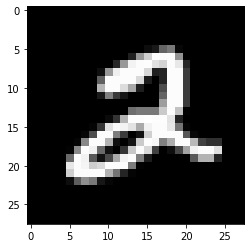

In [9]:
plt.imshow(train_features[5], cmap="gray")

In [10]:
filter1 = np.random.randint(-1,2, size=7*7)

In [11]:
filter1

array([ 0,  1,  0,  1, -1,  1,  1, -1, -1, -1,  1, -1,  0, -1,  1,  1, -1,
        1,  1,  0,  0,  1,  0,  0, -1, -1, -1,  1, -1, -1,  0,  1, -1, -1,
        0, -1,  0,  1,  0, -1,  1,  0,  0, -1,  0,  1,  1,  0, -1])

In [12]:
filter1.shape

(49,)

In [13]:
filter1.reshape(7,7)

array([[ 0,  1,  0,  1, -1,  1,  1],
       [-1, -1, -1,  1, -1,  0, -1],
       [ 1,  1, -1,  1,  1,  0,  0],
       [ 1,  0,  0, -1, -1, -1,  1],
       [-1, -1,  0,  1, -1, -1,  0],
       [-1,  0,  1,  0, -1,  1,  0],
       [ 0, -1,  0,  1,  1,  0, -1]])

In [14]:
filter1

array([ 0,  1,  0,  1, -1,  1,  1, -1, -1, -1,  1, -1,  0, -1,  1,  1, -1,
        1,  1,  0,  0,  1,  0,  0, -1, -1, -1,  1, -1, -1,  0,  1, -1, -1,
        0, -1,  0,  1,  0, -1,  1,  0,  0, -1,  0,  1,  1,  0, -1])

In [15]:
x = train_features[0]
filter = filter1.reshape(7,7)

In [16]:
x.shape

(28, 28)

In [17]:
filter.shape

(7, 7)

In [18]:
def plotMatrix(x):
  for i in range(0, x.shape[0]):
    row = ""
    for j in range(0, x.shape[1]):
      if x[i][j] != 0:
        row += str(x[i][j]) + "\t"
      else:
        row += "." + "\t"
    print(row)
  
  return None

In [19]:
plotMatrix(train_features[7])

.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	38	43	105	255	253	253	253	253	253	174	6	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	43	139	224	226	252	253	252	252	252	252	252	252	158	14	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	178	252	252	252	252	253	252	252	252	252	252	252	252	59	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	109	252	252	230	132	133	132	132	189	252	252	252	252	59	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	4	29	29	24	.	.	.	.	14	226	252	252	172	7	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	85	243	252	252	144	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	88	189	252	252	252	14	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	91	212	247	252	252	252	204	9	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	32	125	193	193	193	253	252	252	252	238	102	28	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	45	222	252	252	252	252

In [20]:
x = np.array(range(1, 101)).reshape(10, 10)
filter = np.random.randint(0, 2, size=(3*3)).reshape(3,3)

print(x)
print(filter)

[[  1   2   3   4   5   6   7   8   9  10]
 [ 11  12  13  14  15  16  17  18  19  20]
 [ 21  22  23  24  25  26  27  28  29  30]
 [ 31  32  33  34  35  36  37  38  39  40]
 [ 41  42  43  44  45  46  47  48  49  50]
 [ 51  52  53  54  55  56  57  58  59  60]
 [ 61  62  63  64  65  66  67  68  69  70]
 [ 71  72  73  74  75  76  77  78  79  80]
 [ 81  82  83  84  85  86  87  88  89  90]
 [ 91  92  93  94  95  96  97  98  99 100]]
[[1 1 1]
 [0 0 0]
 [0 0 1]]


### Filters

In [21]:
# https://en.wikipedia.org/wiki/Kernel_(image_processing)

# Define kernels
#define identity mat3(0, 0, 0, 0, 1, 0, 0, 0, 0)
#define edge0 mat3(1, 0, -1, 0, 0, 0, -1, 0, 1)
#define edge1 mat3(0, 1, 0, 1, -4, 1, 0, 1, 0)
#define edge2 mat3(-1, -1, -1, -1, 8, -1, -1, -1, -1)
#define sharpen mat3(0, -1, 0, -1, 5, -1, 0, -1, 0)
#define box_blur mat3(1, 1, 1, 1, 1, 1, 1, 1, 1) * 0.1111
#define gaussian_blur mat3(1, 2, 1, 2, 4, 2, 1, 2, 1) * 0.0625
#define emboss mat3(-2, -1, 0, -1, 1, 1, 0, 1, 2)

In [22]:
identity = np.asarray([0, 0, 0, 0, 1, 0, 0, 0, 0]).reshape(3,3)
edge0 = np.asarray([1, 0, -1, 0, 0, 0, -1, 0, 1]).reshape(3,3)
edge1 = np.asarray([0, 1, 0, 1, -4, 1, 0, 1, 0]).reshape(3,3)
edge2 = np.asarray([-1, -1, -1, -1, 8, -1, -1, -1, -1]).reshape(3,3)
sharpen = np.asarray([0, -1, 0, -1, 5, -1, 0, -1, 0]).reshape(3,3)
box_blur = np.asarray([1, 1, 1, 1, 1, 1, 1, 1, 1]).reshape(3,3) * 0.111
gaussian_blur = np.asarray([1, 2, 1, 2, 4, 2, 1, 2, 1]).reshape(3,3) * 0.0625
emboss = np.asarray([-2, -1, 0, -1, 1, 1, 0, 1, 2]).reshape(3,3)

In [23]:
edge1

array([[ 0,  1,  0],
       [ 1, -4,  1],
       [ 0,  1,  0]])

In [24]:
box_blur

array([[0.111, 0.111, 0.111],
       [0.111, 0.111, 0.111],
       [0.111, 0.111, 0.111]])

In [25]:
stride = 1
for i_ in range(0, x.shape[0], stride):
  if i_ + filter.shape[0] > x.shape[0]: break
  for j_ in range(0, x.shape[0], stride):
    if j_ + filter.shape[0] > x.shape[0]: break
    for i in range(i_, i_ + filter.shape[0]):
      row = ""
      if j_ + filter.shape[0] > x.shape[0]: break
      for j in range(j_, j_ + filter.shape[1]):
        if j + stride > x.shape[0]: break
        if x[i][j] != 0:
          row += str(x[i][j]) + "\t"
        else:
          row += "." + "\t"
      print(row)
    print()
    

1	2	3	
11	12	13	
21	22	23	

2	3	4	
12	13	14	
22	23	24	

3	4	5	
13	14	15	
23	24	25	

4	5	6	
14	15	16	
24	25	26	

5	6	7	
15	16	17	
25	26	27	

6	7	8	
16	17	18	
26	27	28	

7	8	9	
17	18	19	
27	28	29	

8	9	10	
18	19	20	
28	29	30	

11	12	13	
21	22	23	
31	32	33	

12	13	14	
22	23	24	
32	33	34	

13	14	15	
23	24	25	
33	34	35	

14	15	16	
24	25	26	
34	35	36	

15	16	17	
25	26	27	
35	36	37	

16	17	18	
26	27	28	
36	37	38	

17	18	19	
27	28	29	
37	38	39	

18	19	20	
28	29	30	
38	39	40	

21	22	23	
31	32	33	
41	42	43	

22	23	24	
32	33	34	
42	43	44	

23	24	25	
33	34	35	
43	44	45	

24	25	26	
34	35	36	
44	45	46	

25	26	27	
35	36	37	
45	46	47	

26	27	28	
36	37	38	
46	47	48	

27	28	29	
37	38	39	
47	48	49	

28	29	30	
38	39	40	
48	49	50	

31	32	33	
41	42	43	
51	52	53	

32	33	34	
42	43	44	
52	53	54	

33	34	35	
43	44	45	
53	54	55	

34	35	36	
44	45	46	
54	55	56	

35	36	37	
45	46	47	
55	56	57	

36	37	38	
46	47	48	
56	57	58	

37	38	39	
47	48	49	
57	58	59	

38	39	40	
48	49	50	
58	59	60	

41	42	43	
51	52	53	
61	62	63	



## Convolution

Image Dimensions = 5 (Height) x 5 (Breadth) x 1 (Number of channels, eg. RGB)

In the above demonstration, the green section resembles our 5x5x1 input image, I. 

The element involved in carrying out the convolution operation in the first part of a Convolutional Layer is called the Kernel/Filter, K, represented in the color yellow. We have selected K as a 3x3x1 matrix.




In [26]:
def generateConvolutedWindows(imageArray, kernelShape=(2,2), stride=1):
  convWindows = []
  imgWidth = imageArray.shape[1]
  imgHeight = imageArray.shape[0]
  kernelWidth = kernelShape[1]
  kernelHeight = kernelShape[0]
  
  for iImg in range(0, imgHeight, stride):
    if iImg + kernelHeight > imgHeight: break
    for jImg in range(0, imgWidth, stride):
      if jImg + kernelWidth > imgWidth: break
      convWindow = []
      for i in range(iImg, iImg + kernelHeight):
        for j in range(jImg, jImg + kernelWidth):
          convWindow.append(imageArray[i][j])
          # for j
        # for i
      convWindows.append(np.array(convWindow).reshape(kernelWidth, kernelHeight))
    # for jImg
  # for iImg
  convWindows = np.array(convWindows)
  #print(convWindows)
  print(convWindows.shape)
  return convWindows

In [27]:
def generateConvolutedArray(imageArray, kernelArray, stride=1):
  convWindows = generateConvolutedWindows(imageArray, kernelShape=kernelArray.shape, stride=stride)
  convArray = []
  for window in convWindows:
    convArray.append(np.sum(np.dot(window, kernelArray)))
    # end for
  resultShape = (((imageArray.shape[1] - kernelArray.shape[1]) // stride) + 1, ((imageArray.shape[0] - kernelArray.shape[0]) // stride) + 1)
  convArray = np.array(convArray).reshape(resultShape[1], resultShape[0])

  return convArray

In [28]:
x = train_features[5]
fX, fY = 3, 3
filter = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
convArray = generateConvolutedArray(x, filter, 2)

(169, 3, 3)


In [29]:
x.shape

(28, 28)

In [30]:
filter

array([[1, 1, 1],
       [0, 1, 0],
       [1, 0, 0]])

In [31]:
convArray.shape

(13, 13)

In [32]:
plotMatrix(convArray)

.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	184	951	1557	1275	.	.	.	
.	.	.	.	167	1139	2396	3149	2777	2998	300	.	.	
.	.	.	.	948	3435	3342	1773	1000	3204	540	.	.	
.	.	.	.	587	1692	923	90	1090	3204	540	.	.	
.	.	.	.	10	262	1274	1873	2466	2740	189	.	.	
.	.	.	89	1044	2378	2365	2785	3739	2630	286	.	.	
.	.	144	1387	2772	1600	1030	2660	2512	2395	2256	1527	816	
.	.	979	3193	2284	1997	2604	1453	209	277	1251	1988	780	
.	.	1048	3009	2661	1964	995	9	.	.	.	.	.	
.	.	106	543	392	18	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	


In [33]:
def plotArrays(arrayMaps):
  i = 1
  N = len(arrayMaps)
  plt.figure(figsize=(28, 28))
  for key, value in arrayMaps.items():
    plt.subplot(1, N, i)
    i = i + 1
    plt.imshow(value)
    plt.title(key)
  plt.show()

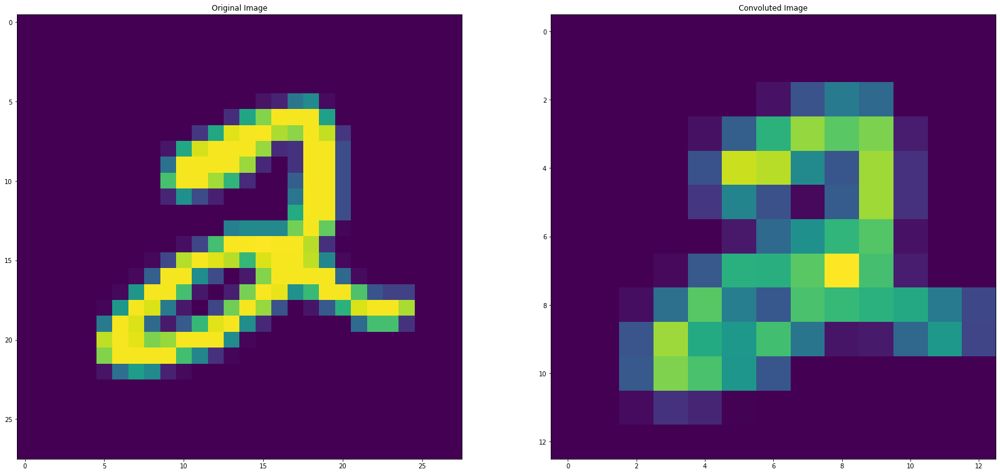

In [34]:
arrayMaps = dict()
arrayMaps['Original Image'] = x
arrayMaps['Convoluted Image'] = convArray

plotArrays(arrayMaps)

## Pooling

The pooling operation involves sliding a two-dimensional filter over each channel of feature map and summarising the features lying within the region covered by the filter.

For a feature map having dimensions nh x nw x nc, the dimensions of output obtained after a pooling layer is (nh - f + 1) / s x (nw - f + 1)/s x nc
where,

- nh - height of feature map
- nw - width of feature map
- nc - number of channels in the feature map
- f  - size of filter
- s  - stride length

A common CNN model architecture is to have a number of convolution and pooling layers stacked one after the other.


### Why to use Pooling Layers?

Pooling layers are used to reduce the dimensions of the feature maps. Thus, it reduces the number of parameters to learn and the amount of computation performed in the network.

The pooling layer summarises the features present in a region of the feature map generated by a convolution layer. So, further operations are performed on summarised features instead of precisely positioned features generated by the convolution layer. This makes the model more robust to variations in the position of the features in the input image.

In [35]:
def generatePoolingArray(imageArray, kernelArray, stride=2, poolingType="MAX"):
  poolingWindows = generateConvolutedWindows(imageArray, kernelArray.shape, stride)

  poolingArray = np.array([])
  for window in poolingWindows:
    if poolingType == "MAX":
      element = window.max()
    elif poolingType == "SUM":
      element = window.sum()
    elif poolingType == "AVG":
      element = window.mean()
    poolingArray = np.append(poolingArray, element)
  
  resultShape = (((imageArray.shape[1] - kernelArray.shape[1]) // stride) + 1, ((imageArray.shape[0] - kernelArray.shape[0]) // stride) + 1)
  poolingArray = np.array(poolingArray).reshape(resultShape[1], resultShape[0])
  return poolingArray

In [36]:
x = train_features[5]
fX, fY = 3, 3
filter = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
maxPoolingArray = generatePoolingArray(imageArray=x, kernelArray=filter, stride=2, poolingType="MAX")
maxPoolingArray.shape

(169, 3, 3)


(13, 13)

In [37]:
plotMatrix(maxPoolingArray)

.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	151.0	252.0	252.0	252.0	.	.	.	
.	.	.	.	152.0	252.0	252.0	253.0	252.0	252.0	60.0	.	.	
.	.	.	.	252.0	252.0	252.0	252.0	252.0	252.0	60.0	.	.	
.	.	.	.	252.0	252.0	220.0	30.0	252.0	252.0	60.0	.	.	
.	.	.	.	10.0	179.0	253.0	255.0	253.0	252.0	60.0	.	.	
.	.	.	78.0	252.0	252.0	253.0	255.0	253.0	252.0	87.0	.	.	
.	.	136.0	252.0	252.0	252.0	252.0	253.0	252.0	252.0	252.0	252.0	223.0	
.	.	252.0	252.0	252.0	252.0	252.0	252.0	65.0	163.0	252.0	252.0	223.0	
.	.	252.0	252.0	252.0	252.0	252.0	3.0	.	.	.	.	.	
.	.	93.0	143.0	121.0	6.0	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	


In [38]:
avgPoolingArray = generatePoolingArray(imageArray=x, kernelArray=filter, stride=2, poolingType="AVG")
avgPoolingArray.shape

(169, 3, 3)


(13, 13)

In [39]:
plotMatrix(avgPoolingArray)

.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	20.444444444444443	72.11111111111111	111.44444444444444	58.55555555555556	.	.	.	
.	.	.	.	18.555555555555557	92.77777777777777	176.44444444444446	204.33333333333334	195.88888888888889	165.11111111111111	11.11111111111111	.	.	
.	.	.	.	105.33333333333333	235.88888888888889	210.44444444444446	86.11111111111111	104.22222222222223	188.0	20.0	.	.	
.	.	.	.	65.22222222222223	103.55555555555556	48.77777777777778	3.3333333333333335	121.11111111111111	188.0	20.0	.	.	
.	.	.	.	1.1111111111111112	26.88888888888889	101.77777777777777	125.0	190.88888888888889	141.77777777777777	7.0	.	.	
.	.	.	9.88888888888889	97.55555555555556	155.55555555555554	155.88888888888889	211.44444444444446	247.22222222222223	134.22222222222223	11.11111111111111	.	.	
.	.	16.0	122.77777777777777	181.11111111111111	78.0	89.55555555555556	190.44444444444446	153.77777777777777	168.55555555555554	139.11111111111111	99.0	30.22222222222222	
.	.	108.77777777777777	212.5

In [40]:
sumPoolingArray = generatePoolingArray(imageArray=x, kernelArray=filter, stride=2, poolingType="SUM")
sumPoolingArray.shape

(169, 3, 3)


(13, 13)

In [41]:
plotMatrix(sumPoolingArray)

.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	184.0	649.0	1003.0	527.0	.	.	.	
.	.	.	.	167.0	835.0	1588.0	1839.0	1763.0	1486.0	100.0	.	.	
.	.	.	.	948.0	2123.0	1894.0	775.0	938.0	1692.0	180.0	.	.	
.	.	.	.	587.0	932.0	439.0	30.0	1090.0	1692.0	180.0	.	.	
.	.	.	.	10.0	242.0	916.0	1125.0	1718.0	1276.0	63.0	.	.	
.	.	.	89.0	878.0	1400.0	1403.0	1903.0	2225.0	1208.0	100.0	.	.	
.	.	144.0	1105.0	1630.0	702.0	806.0	1714.0	1384.0	1517.0	1252.0	891.0	272.0	
.	.	979.0	1913.0	1216.0	1313.0	1506.0	691.0	79.0	249.0	925.0	1124.0	260.0	
.	.	1048.0	1815.0	1505.0	1092.0	419.0	3.0	.	.	.	.	.	
.	.	106.0	357.0	150.0	6.0	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	


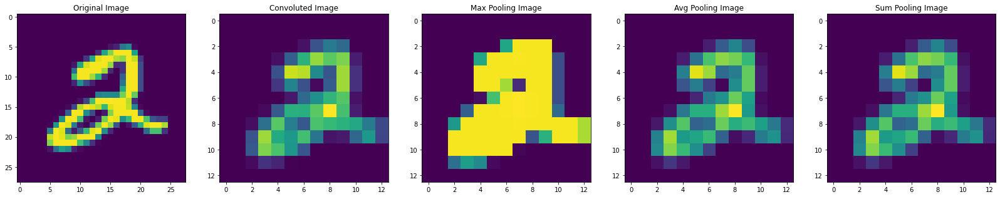

In [42]:
arrayMaps = dict()
arrayMaps['Original Image'] = x
arrayMaps['Convoluted Image'] = convArray
arrayMaps['Max Pooling Image'] = maxPoolingArray
arrayMaps['Avg Pooling Image'] = avgPoolingArray
arrayMaps['Sum Pooling Image'] = sumPoolingArray

plotArrays(arrayMaps)

## Padding

Padding is simply a process of adding layers of zeros to our input images so as to avoid the problems mentioned above.

- This prevents shrinking as, if p = number of layers of zeros added to the border of the image, then our (n x n) image becomes (n + 2p) x (n + 2p) image after padding. So, applying convolution-operation (with (f x f) filter) outputs (n + 2p – f + 1) x (n + 2p – f + 1) images. For example, adding one layer of padding to an (8 x 8) image and using a (3 x 3) filter we would get an (8 x 8) output after performing convolution operation.
- This increases the contribution of the pixels at the border of the original image by bringing them into the middle of the padded image. Thus, information on the borders is preserved as well as the information in the middle of the image.

In [43]:
def generatePadding(x, paddingLayers=1):
  targetShapeM, targetShapeN = x.shape[0] + paddingLayers * 2, x.shape[1] + paddingLayers * 2
  targetX = np.zeros(shape=(targetShapeM, targetShapeN))
  for i in range(0, x.shape[0]):
    for j in range(x.shape[1]):
      targetX[i+paddingLayers][j+paddingLayers] = x[i][j]
      # end j
    # end i
  
  return targetX

In [44]:
x = train_features[5]
paddedX = generatePadding(x, 3)

In [45]:
imageArray = paddedX
fX, fY = 3, 3
filter = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
convArray = generateConvolutedArray(imageArray, filter, 2)

(256, 3, 3)


In [46]:
convArray.shape

(16, 16)

In [47]:
plotMatrix(convArray)

.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	13.0	176.0	451.0	14.0	.	.	.	.	
.	.	.	.	.	.	40.0	661.0	1834.0	2513.0	2763.0	850.0	.	.	.	.	
.	.	.	.	.	111.0	1561.0	3122.0	3436.0	1791.0	2818.0	1792.0	.	.	.	.	
.	.	.	.	.	303.0	2432.0	2531.0	1361.0	272.0	2696.0	1872.0	.	.	.	.	
.	.	.	.	.	26.0	366.0	270.0	584.0	945.0	3128.0	1642.0	.	.	.	.	
.	.	.	.	.	64.0	887.0	2045.0	2889.0	3197.0	3182.0	710.0	.	.	.	.	
.	.	.	.	151.0	1510.0	2827.0	1639.0	1983.0	3541.0	3199.0	2123.0	563.0	196.0	.	.	
.	.	.	108.0	1631.0	2796.0	1478.0	1439.0	2606.0	1749.0	956.0	1992.0	2505.0	1580.0	.	.	
.	.	.	543.0	3337.0	3054.0	2516.0	2520.0	1047.0	58.0	.	89.0	718.0	434.0	.	.	
.	.	.	220.0	1525.0	1811.0	1034.0	308.0	8.0	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	


In [48]:
x = train_features[5]
fX, fY = 3, 3
filter = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
maxPoolingArray = generatePoolingArray(imageArray=convArray, kernelArray=filter, stride=2, poolingType="MAX")
maxPoolingArray.shape

(49, 3, 3)


(7, 7)

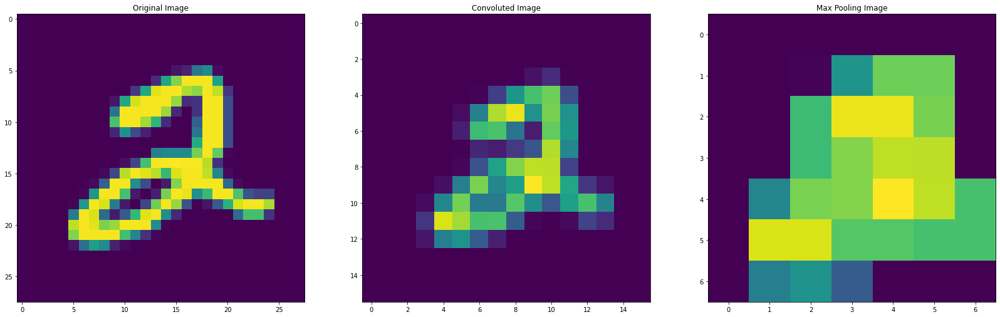

In [49]:
arrayMaps = dict()
arrayMaps['Original Image'] = x
arrayMaps['Convoluted Image'] = convArray
arrayMaps['Max Pooling Image'] = maxPoolingArray

plotArrays(arrayMaps)

In [50]:
maxPoolingArray = generatePoolingArray(imageArray=paddedX, kernelArray=filter, stride=2, poolingType="SUM")
maxPoolingArray.shape

(256, 3, 3)


(16, 16)

In [51]:
plotMatrix(maxPoolingArray)

.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	13.0	138.0	229.0	7.0	.	.	.	.	
.	.	.	.	.	.	40.0	469.0	1154.0	1538.0	1574.0	425.0	.	.	.	.	
.	.	.	.	.	111.0	1046.0	1935.0	1967.0	1038.0	1777.0	896.0	.	.	.	.	
.	.	.	.	.	303.0	1497.0	1475.0	695.0	243.0	1726.0	936.0	.	.	.	.	
.	.	.	.	.	26.0	212.0	190.0	353.0	702.0	1913.0	821.0	.	.	.	.	
.	.	.	.	.	59.0	596.0	1318.0	1754.0	1952.0	1764.0	355.0	.	.	.	.	
.	.	.	.	146.0	1034.0	1610.0	944.0	1343.0	2087.0	1910.0	1157.0	306.0	98.0	.	.	
.	.	.	108.0	1130.0	1586.0	832.0	956.0	1552.0	939.0	640.0	1253.0	1493.0	790.0	.	.	
.	.	.	543.0	2038.0	1770.0	1527.0	1450.0	538.0	29.0	.	89.0	449.0	217.0	.	.	
.	.	.	220.0	960.0	1043.0	575.0	156.0	4.0	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	


In [52]:
avgPoolingArray = generatePoolingArray(imageArray=paddedX, kernelArray=filter, stride=2, poolingType="SUM")
avgPoolingArray.shape

(256, 3, 3)


(16, 16)

In [53]:
plotMatrix(avgPoolingArray)

.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	13.0	138.0	229.0	7.0	.	.	.	.	
.	.	.	.	.	.	40.0	469.0	1154.0	1538.0	1574.0	425.0	.	.	.	.	
.	.	.	.	.	111.0	1046.0	1935.0	1967.0	1038.0	1777.0	896.0	.	.	.	.	
.	.	.	.	.	303.0	1497.0	1475.0	695.0	243.0	1726.0	936.0	.	.	.	.	
.	.	.	.	.	26.0	212.0	190.0	353.0	702.0	1913.0	821.0	.	.	.	.	
.	.	.	.	.	59.0	596.0	1318.0	1754.0	1952.0	1764.0	355.0	.	.	.	.	
.	.	.	.	146.0	1034.0	1610.0	944.0	1343.0	2087.0	1910.0	1157.0	306.0	98.0	.	.	
.	.	.	108.0	1130.0	1586.0	832.0	956.0	1552.0	939.0	640.0	1253.0	1493.0	790.0	.	.	
.	.	.	543.0	2038.0	1770.0	1527.0	1450.0	538.0	29.0	.	89.0	449.0	217.0	.	.	
.	.	.	220.0	960.0	1043.0	575.0	156.0	4.0	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	


In [54]:
sumPoolingArray = generatePoolingArray(imageArray=paddedX, kernelArray=filter, stride=2, poolingType="SUM")
sumPoolingArray.shape

(256, 3, 3)


(16, 16)

In [55]:
plotMatrix(sumPoolingArray)

.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	13.0	138.0	229.0	7.0	.	.	.	.	
.	.	.	.	.	.	40.0	469.0	1154.0	1538.0	1574.0	425.0	.	.	.	.	
.	.	.	.	.	111.0	1046.0	1935.0	1967.0	1038.0	1777.0	896.0	.	.	.	.	
.	.	.	.	.	303.0	1497.0	1475.0	695.0	243.0	1726.0	936.0	.	.	.	.	
.	.	.	.	.	26.0	212.0	190.0	353.0	702.0	1913.0	821.0	.	.	.	.	
.	.	.	.	.	59.0	596.0	1318.0	1754.0	1952.0	1764.0	355.0	.	.	.	.	
.	.	.	.	146.0	1034.0	1610.0	944.0	1343.0	2087.0	1910.0	1157.0	306.0	98.0	.	.	
.	.	.	108.0	1130.0	1586.0	832.0	956.0	1552.0	939.0	640.0	1253.0	1493.0	790.0	.	.	
.	.	.	543.0	2038.0	1770.0	1527.0	1450.0	538.0	29.0	.	89.0	449.0	217.0	.	.	
.	.	.	220.0	960.0	1043.0	575.0	156.0	4.0	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	
.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	.	


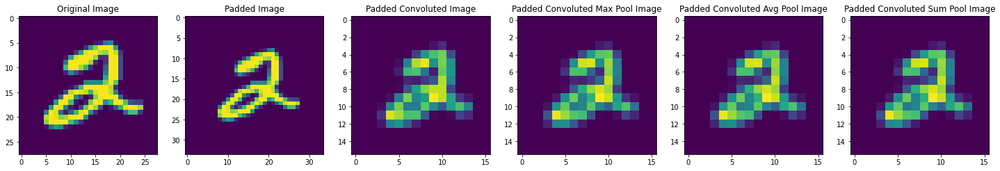

In [56]:
plt.figure(figsize=(25, 25))
plt.subplot(1, 6, 1)
plt.title("Original Image")
plt.imshow(x)
plt.subplot(1, 6, 2)
plt.title("Padded Image")
plt.imshow(paddedX)
plt.subplot(1, 6, 3)
plt.title("Padded Convoluted Image")
plt.imshow(convArray)
plt.subplot(1, 6, 4)
plt.title("Padded Convoluted Max Pool Image")
plt.imshow(maxPoolingArray)
plt.subplot(1, 6, 5)
plt.title("Padded Convoluted Avg Pool Image")
plt.imshow(avgPoolingArray)
plt.subplot(1, 6, 6)
plt.title("Padded Convoluted Sum Pool Image")
plt.imshow(sumPoolingArray)
plt.show()

In [57]:
x = train_features[5]

In [58]:
identity = np.asarray([0, 0, 0, 0, 1, 0, 0, 0, 0]).reshape(3,3)
edge0 = np.asarray([1, 0, -1, 0, 0, 0, -1, 0, 1]).reshape(3,3)
edge1 = np.asarray([0, 1, 0, 1, -4, 1, 0, 1, 0]).reshape(3,3)
edge2 = np.asarray([-1, -1, -1, -1, 8, -1, -1, -1, -1]).reshape(3,3)
sharpen = np.asarray([0, -1, 0, -1, 5, -1, 0, -1, 0]).reshape(3,3)
box_blur = np.asarray([1, 1, 1, 1, 1, 1, 1, 1, 1]).reshape(3,3) * 0.111
gaussian_blur = np.asarray([1, 2, 1, 2, 4, 2, 1, 2, 1]).reshape(3,3) * 0.0625
emboss = np.asarray([-2, -1, 0, -1, 1, 1, 0, 1, 2]).reshape(3,3)

In [59]:
filter = identity
identityConvArray = generateConvolutedArray(imageArray=paddedX, kernelArray=identity, stride=2)

filter = edge0
edge0ConvArray = generateConvolutedArray(imageArray=paddedX, kernelArray=edge0, stride=2)

filter = edge1
edge1ConvArray = generateConvolutedArray(imageArray=paddedX, kernelArray=edge1, stride=2)

filter = edge2
edge2ConvArray = generateConvolutedArray(imageArray=paddedX, kernelArray=edge2, stride=2)

filter = sharpen
sharpenConvArray = generateConvolutedArray(imageArray=paddedX, kernelArray=sharpen, stride=2)

filter = box_blur
box_blurConvArray = generateConvolutedArray(imageArray=paddedX, kernelArray=box_blur, stride=2)

filter = gaussian_blur
gaussian_blurConvArray = generateConvolutedArray(imageArray=paddedX, kernelArray=gaussian_blur, stride=2)

filter = emboss
embossConvArray = generateConvolutedArray(imageArray=paddedX, kernelArray=emboss, stride=2)

(256, 3, 3)
(256, 3, 3)
(256, 3, 3)
(256, 3, 3)
(256, 3, 3)
(256, 3, 3)
(256, 3, 3)
(256, 3, 3)


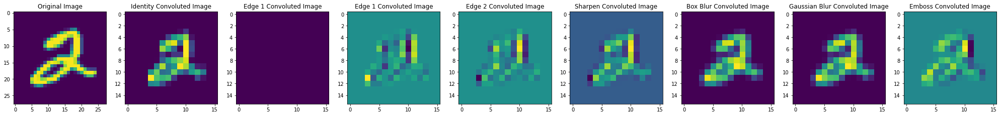

In [60]:
plt.figure(figsize=(35, 35))
plt.subplot(1, 9, 1)
plt.title("Original Image")
plt.imshow(x)
plt.subplot(1, 9, 2)
plt.title("Identity Convoluted Image")
plt.imshow(identityConvArray)
plt.subplot(1, 9, 3)
plt.title("Edge 1 Convoluted Image")
plt.imshow(edge0ConvArray)
plt.subplot(1, 9, 4)
plt.title("Edge 1 Convoluted Image")
plt.imshow(edge1ConvArray)
plt.subplot(1, 9, 5)
plt.title("Edge 2 Convoluted Image")
plt.imshow(edge2ConvArray)
plt.subplot(1, 9, 6)
plt.title("Sharpen Convoluted Image")
plt.imshow(sharpenConvArray)
plt.subplot(1, 9, 7)
plt.title("Box Blur Convoluted Image")
plt.imshow(box_blurConvArray)
plt.subplot(1, 9, 8)
plt.title("Gaussian Blur Convoluted Image")
plt.imshow(gaussian_blurConvArray)
plt.subplot(1, 9, 9)
plt.title("Emboss Convoluted Image")
plt.imshow(embossConvArray)
plt.show()

In [61]:
from keras.preprocessing.image import ImageDataGenerator

In [62]:
# With data augmentation to prevent overfitting (accuracy 0.99286)
"""
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images


datagen.fit(X_train)
"""

'\ndatagen = ImageDataGenerator(\n        featurewise_center=False,  # set input mean to 0 over the dataset\n        samplewise_center=False,  # set each sample mean to 0\n        featurewise_std_normalization=False,  # divide inputs by std of the dataset\n        samplewise_std_normalization=False,  # divide each input by its std\n        zca_whitening=False,  # apply ZCA whitening\n        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)\n        zoom_range = 0.1, # Randomly zoom image \n        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)\n        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)\n        horizontal_flip=False,  # randomly flip images\n        vertical_flip=False)  # randomly flip images\n\n\ndatagen.fit(X_train)\n'

[link text](https://www.kaggle.com/yassineghouzam/introduction-to-cnn-keras-0-997-top-6)

Data augmentation
In order to avoid overfitting problem, we need to expand artificially our handwritten digit dataset. We can make your existing dataset even larger. The idea is to alter the training data with small transformations to reproduce the variations occuring when someone is writing a digit.

For example, the number is not centered The scale is not the same (some who write with big/small numbers) The image is rotated...

Approaches that alter the training data in ways that change the array representation while keeping the label the same are known as data augmentation techniques. Some popular augmentations people use are grayscales, horizontal flips, vertical flips, random crops, color jitters, translations, rotations, and much more.

By applying just a couple of these transformations to our training data, we can easily double or triple the number of training examples and create a very robust model.

The improvement is important :

Without data augmentation i obtained an accuracy of 98.114%
With data augmentation i achieved 99.67% of accuracy

For the data augmentation, i choosed to :

- Randomly rotate some training images by 10 degrees
- Randomly Zoom by 10% some training images
- Randomly shift images horizontally by 10% of the width
- Randomly shift images vertically by 10% of the height

I did not apply a vertical_flip nor horizontal_flip since it could have lead to misclassify symetrical numbers such as 6 and 9.



In [63]:
from tensorflow.keras.datasets import fashion_mnist
(train_features, train_labels), (test_features, test_labels) = fashion_mnist.load_data()

4423680/4422102 [==============================] - 0s 0us/step


In [64]:
x = train_features[5]
plotMatrix(x)

.	.	.	.	1	.	.	.	.	22	88	188	172	132	125	141	199	143	9	.	.	.	1	.	.	.	.	.	
.	.	.	1	.	.	20	131	199	206	196	202	242	255	255	250	222	197	206	188	126	17	.	.	.	.	.	.	
.	.	.	1	.	35	214	191	183	178	175	168	150	162	159	152	158	179	183	189	195	185	82	.	.	.	.	.	
.	.	.	.	.	170	190	172	177	176	171	169	162	155	148	154	169	174	175	175	177	183	188	12	.	.	.	.	
.	.	.	.	25	194	180	178	174	184	187	189	187	184	181	189	200	197	193	190	178	175	194	90	.	.	.	.	
.	.	.	.	42	218	191	197	208	204	211	209	210	212	211	214	215	213	214	211	211	191	200	158	.	.	.	.	
.	.	.	.	88	221	215	217	219	211	185	150	118	107	99	88	83	90	135	212	203	207	219	169	.	.	.	.	
.	.	.	.	.	27	118	162	40	.	.	.	10	19	28	39	47	36	.	.	203	230	220	203	.	.	.	.	
.	.	.	.	138	136	71	69	54	216	217	203	184	168	163	162	163	178	221	186	38	26	7	.	.	.	.	.	
.	.	.	.	67	134	154	224	129	66	81	117	129	128	132	137	131	129	86	73	157	151	134	216	18	.	.	.	
.	.	.	.	203	198	172	183	206	255	255	250	243	240	239	235	238	244	255	238	184	160	86	98	.	.	.	.	
.	.	.	.	122	188	224

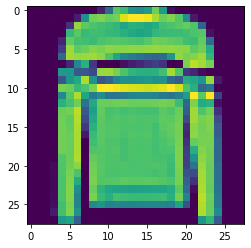

In [65]:
plt.imshow(x)

In [66]:
x = train_features[5]

filter = np.random.randint(0, 2, size=(3*3)).reshape(3,3)
convArray = generateConvolutedArray(imageArray=x, kernelArray=filter, stride=2)

(169, 3, 3)


In [67]:
convArray.shape

(13, 13)

In [68]:
plotMatrix(convArray)

.	6	539	1642	2112	2703	2740	2783	2413	1794	891	83	.	
.	52	1991	2734	2676	2583	2477	2532	2729	2759	2564	668	.	
.	310	2593	2972	2965	2709	2503	2469	2582	2952	2964	1447	.	
.	452	1802	1926	1971	1732	1480	1454	1613	2040	2262	1190	.	
.	816	2138	2127	2569	2805	2696	2666	2758	2314	1507	891	18	
.	976	2810	2384	2723	2745	2758	2753	2754	2427	2520	1582	59	
.	1118	3015	2007	2744	2828	2817	2809	2882	2158	2596	1893	104	
.	1202	3113	1882	2745	2776	2768	2748	2835	2016	2609	2255	209	
.	1202	3119	1770	2776	2753	2748	2734	2772	1995	2463	2316	245	
.	1158	3081	1815	2812	2755	2739	2738	2704	2047	2178	2362	266	
.	1142	2879	1762	2839	2783	2784	2781	2721	2132	1889	2402	282	
.	1134	2591	1608	2659	2571	2555	2565	2548	2259	1717	2454	299	
.	1150	2498	1010	1491	1449	1442	1458	1429	1329	1534	2532	335	


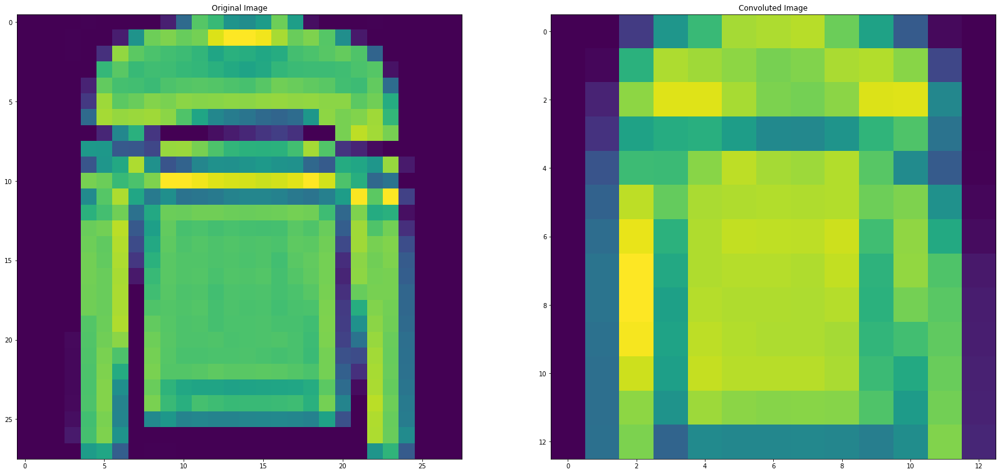

In [69]:
arrayMaps = dict()
arrayMaps['Original Image'] = x
arrayMaps['Convoluted Image'] = convArray

plotArrays(arrayMaps)

In [70]:
maxPoolingArray =  generatePoolingArray(imageArray=x, kernelArray=filter, stride=2, poolingType="MAX")
maxPoolingArray.shape

(169, 3, 3)


(13, 13)

In [71]:
avgPoolingArray = generatePoolingArray(imageArray=x, kernelArray=filter, stride=2, poolingType="AVG")
avgPoolingArray.shape

(169, 3, 3)


(13, 13)

In [72]:
sumPoolingArray = generatePoolingArray(imageArray=x, kernelArray=filter, stride=2, poolingType="SUM")
sumPoolingArray.shape

(169, 3, 3)


(13, 13)

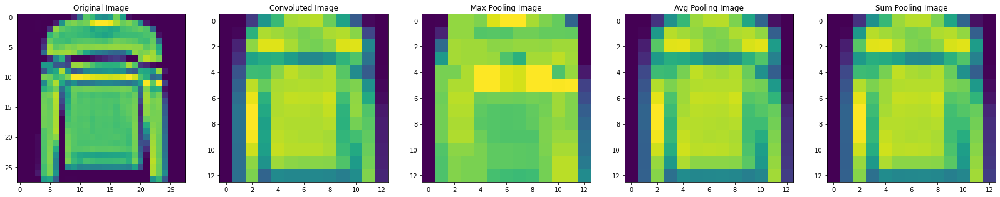

In [73]:
arrayMaps = dict()
arrayMaps['Original Image'] = x
arrayMaps['Convoluted Image'] = convArray
arrayMaps['Max Pooling Image'] = maxPoolingArray
arrayMaps['Avg Pooling Image'] = avgPoolingArray
arrayMaps['Sum Pooling Image'] = sumPoolingArray

plotArrays(arrayMaps)

In [74]:
!pwd

/content


In [75]:
!curl -v -k "https://static.autox.com/uploads/2020/09/2020-land-rover-discovery-sport-in-action-m.jpg" -o `pwd`/"sample.jpg" > /dev/null 2>&1
#!curl -v -k  "https://res.heraldm.com/phpwas/restmb_idxmake.php?idx=142&simg=%2Fcontent%2Fimage%2F2016%2F08%2F22%2F20160822000780_0.jpg" -o `pwd`/"sample.jpg"
#!curl -v -k  "https://onlinejpgtools.com/images/examples-onlinejpgtools/rgb.jpg" -o `pwd`/"sample.jpg"
!echo $?

0


In [76]:
%ls -lrtah

total 244K
drwxr-xr-x 1 root root 4.0K Dec 21 17:29 sample_data/
drwxr-xr-x 1 root root 4.0K Dec 21 17:29 .config/
drwxr-xr-x 1 root root 4.0K Dec 27 02:15 ../
drwxr-xr-x 1 root root 4.0K Dec 27 02:17 ./
-rw-r--r-- 1 root root 228K Dec 27 02:17 sample.jpg


In [77]:
import PIL

In [78]:
PIL.__version__

'7.0.0'

In [79]:
from PIL import Image, ImageFilter

In [80]:
SAMPLE_IMAGE="sample.jpg"
img = Image.open(SAMPLE_IMAGE)

In [81]:
img

Output hidden; open in https://colab.research.google.com to view.

In [82]:
img.format

'JPEG'

In [83]:
img.size

(1280, 720)

In [84]:
img.mode

'RGB'

In [85]:
list(img.getdata())

[(63, 102, 21),
 (58, 97, 14),
 (56, 96, 8),
 (58, 99, 7),
 (61, 102, 8),
 (68, 108, 11),
 (81, 122, 20),
 (95, 136, 34),
 (95, 136, 34),
 (92, 130, 31),
 (91, 128, 33),
 (87, 123, 33),
 (82, 118, 31),
 (89, 124, 42),
 (98, 132, 55),
 (95, 127, 51),
 (81, 124, 19),
 (84, 126, 24),
 (80, 124, 27),
 (74, 117, 28),
 (73, 116, 34),
 (75, 119, 40),
 (74, 118, 41),
 (70, 114, 37),
 (73, 117, 38),
 (67, 112, 31),
 (68, 111, 29),
 (67, 109, 27),
 (59, 100, 21),
 (60, 98, 21),
 (60, 96, 24),
 (53, 89, 19),
 (57, 92, 8),
 (63, 98, 14),
 (64, 100, 13),
 (57, 93, 6),
 (52, 88, 1),
 (54, 92, 5),
 (61, 100, 11),
 (65, 104, 15),
 (65, 104, 15),
 (75, 114, 23),
 (89, 128, 37),
 (107, 146, 55),
 (127, 166, 73),
 (131, 170, 77),
 (107, 146, 53),
 (78, 117, 24),
 (76, 121, 38),
 (80, 123, 41),
 (82, 125, 43),
 (78, 120, 38),
 (69, 108, 27),
 (60, 98, 13),
 (63, 102, 13),
 (74, 111, 16),
 (92, 130, 31),
 (82, 120, 17),
 (82, 120, 19),
 (97, 135, 36),
 (107, 146, 53),
 (105, 145, 59),
 (101, 140, 61),
 (10

In [86]:
imgArr = np.asarray(img)

In [87]:
imgArr.shape

(720, 1280, 3)

In [88]:
imgArr

array([[[ 63, 102,  21],
        [ 58,  97,  14],
        [ 56,  96,   8],
        ...,
        [119, 159,  60],
        [126, 166,  67],
        [134, 174,  77]],

       [[ 61, 100,  17],
        [ 57,  97,  11],
        [ 55,  95,   7],
        ...,
        [138, 177,  88],
        [141, 179,  92],
        [148, 186, 101]],

       [[ 61, 101,  15],
        [ 59,  99,  11],
        [ 58,  98,  10],
        ...,
        [144, 180, 106],
        [146, 181, 113],
        [149, 184, 120]],

       ...,

       [[ 90, 144,   6],
        [ 83, 137,   0],
        [ 74, 127,   0],
        ...,
        [157, 156, 136],
        [159, 158, 138],
        [161, 160, 140]],

       [[ 84, 139,   0],
        [ 80, 134,   0],
        [ 74, 127,   0],
        ...,
        [161, 160, 139],
        [162, 161, 140],
        [161, 160, 139]],

       [[ 79, 134,   0],
        [ 78, 132,   0],
        [ 75, 128,   0],
        ...,
        [155, 154, 133],
        [156, 155, 134],
        [153, 152, 131]]

In [89]:
red, green, blue = img.split()

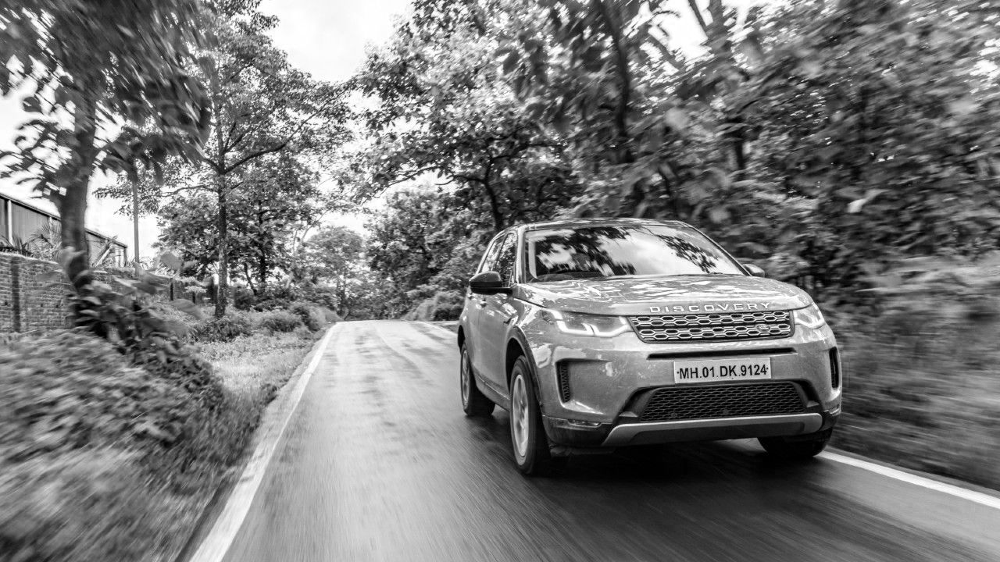

In [90]:
red

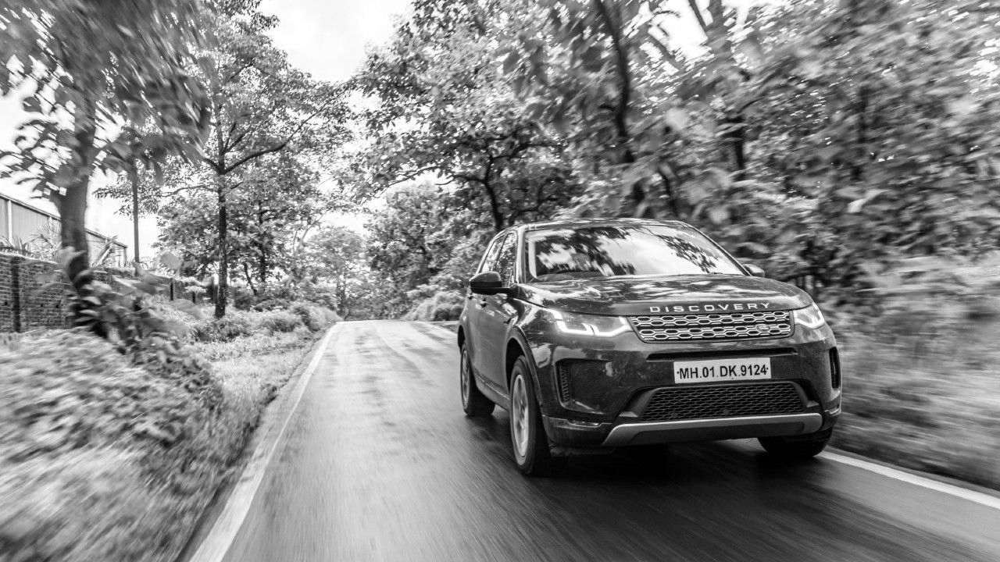

In [91]:
green

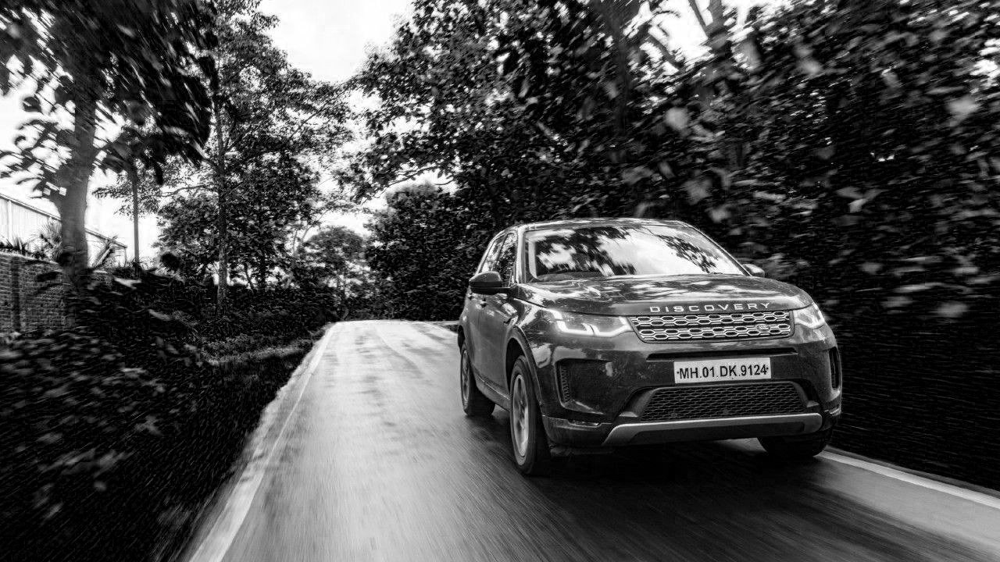

In [92]:
blue

In [93]:
#img.thumbnail(size=(100,90))

In [94]:
img.tell()

0

In [95]:
red = img.getchannel("R")

In [96]:
img.show()

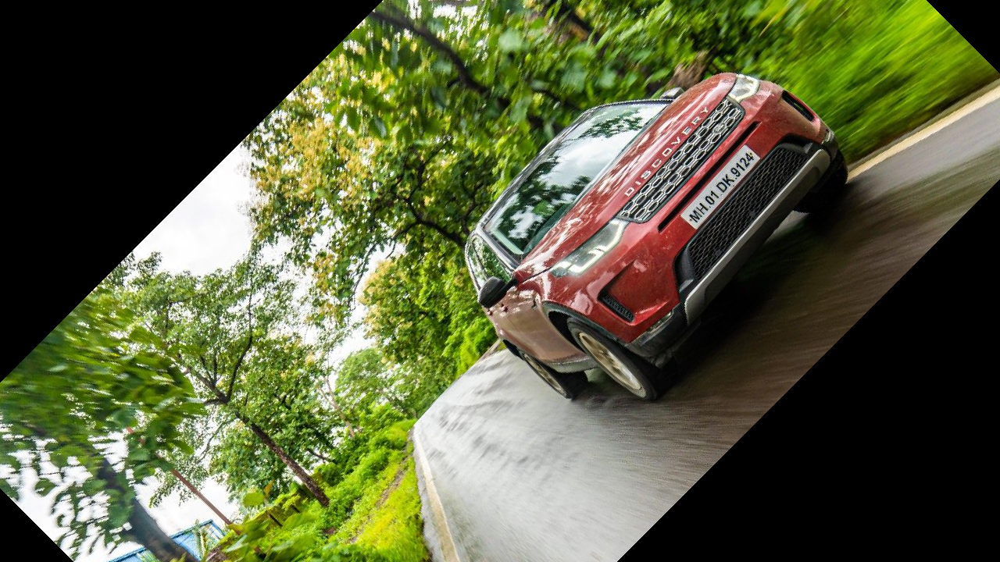

In [97]:
im_rotated = img.rotate(angle=45)
im_rotated

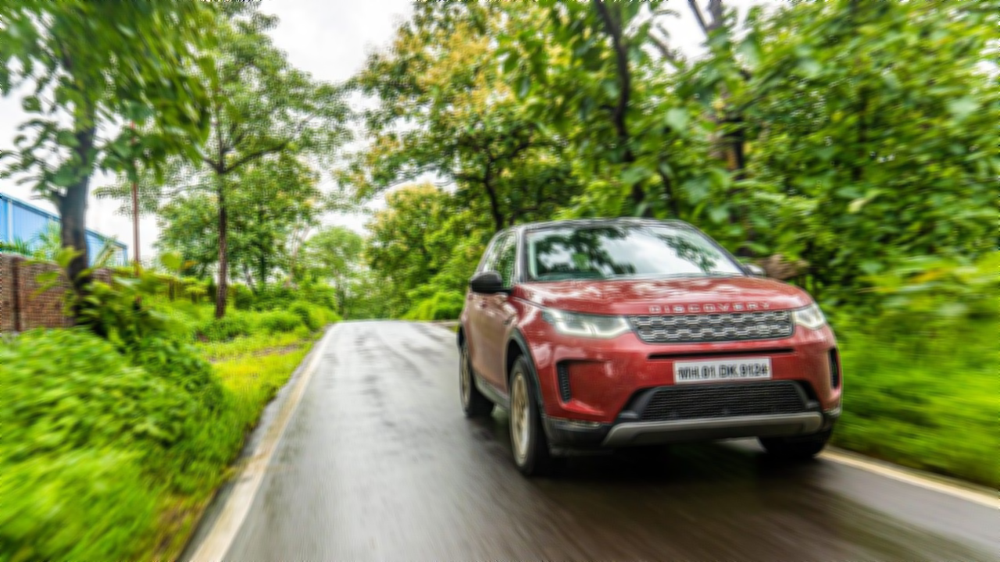

In [98]:
im_mod = img.filter(filter=ImageFilter.BLUR)
im_mod

In [99]:
im_mod = img.filter(filter=ImageFilter.CONTOUR)
im_mod

Output hidden; open in https://colab.research.google.com to view.

In [100]:
im_mod = img.filter(filter=ImageFilter.DETAIL)
im_mod

Output hidden; open in https://colab.research.google.com to view.

In [101]:
im_mod = img.filter(filter=ImageFilter.EDGE_ENHANCE)
im_mod

Output hidden; open in https://colab.research.google.com to view.

In [102]:
im_mod = img.filter(filter=ImageFilter.EMBOSS)
im_mod

Output hidden; open in https://colab.research.google.com to view.

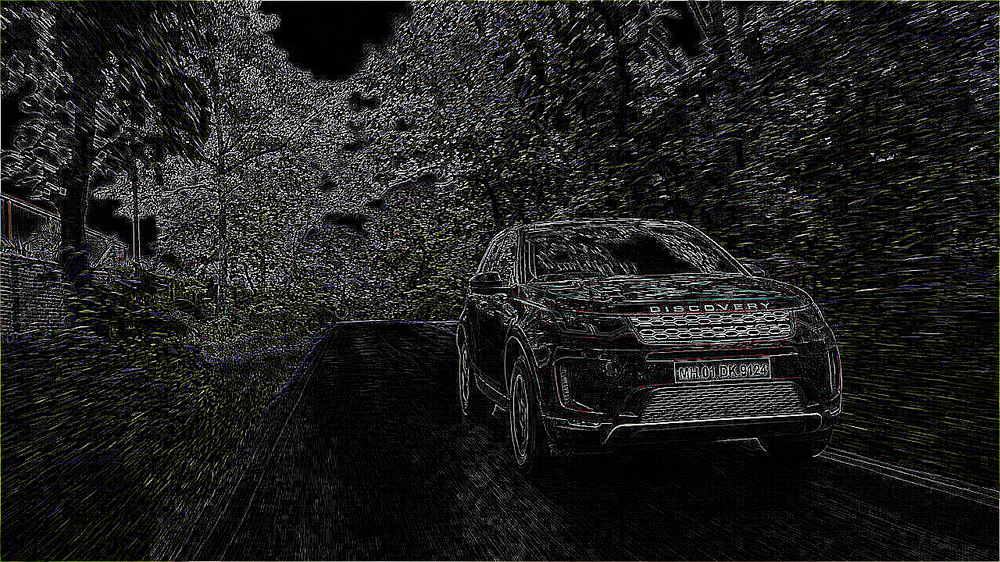

In [103]:
im_mod = img.filter(filter=ImageFilter.FIND_EDGES)
im_mod

In [104]:
im_mod = img.filter(filter=ImageFilter.SHARPEN)
im_mod

Output hidden; open in https://colab.research.google.com to view.

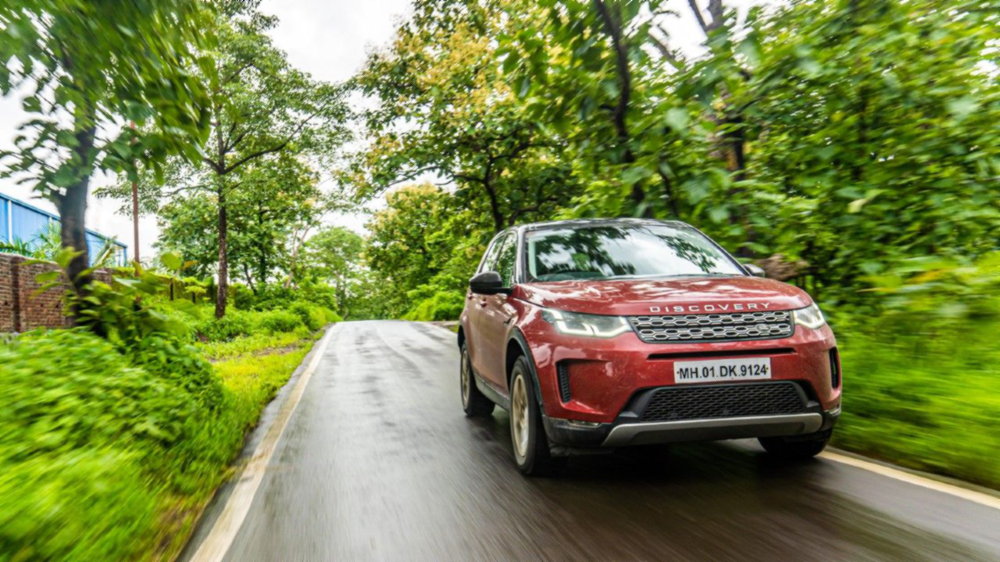

In [105]:
im_mod = img.filter(filter=ImageFilter.SMOOTH)
im_mod

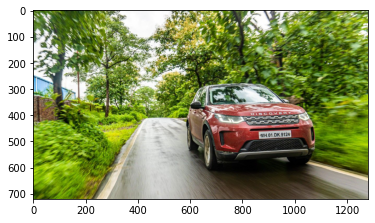

In [106]:
plt.imshow(imgArr)

In [107]:
imgArr.shape

(720, 1280, 3)

In [108]:
imgArr[0].shape

(1280, 3)

In [109]:
redArr = np.asarray(red)
redArr.shape

(720, 1280)

In [110]:
outArr = np.zeros(shape=(redArr.shape[0], redArr.shape[1]//2))

for i in range(0, redArr.shape[0]):
  for j in range(0, redArr.shape[1], 2):
    outArr[i][j//2] = redArr[i][j]

In [111]:
outArr.shape

(720, 640)

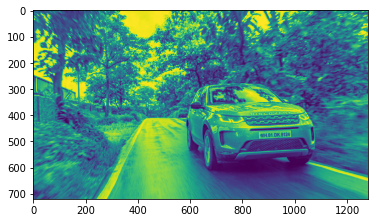

In [112]:
plt.imshow(redArr)

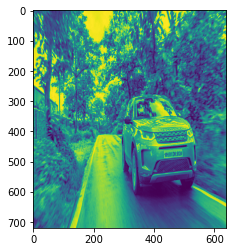

In [113]:
plt.imshow(outArr) # width is halved

In [114]:
outArr = np.zeros(shape=(redArr.shape[0]//2 + 1, redArr.shape[1]))

for i in range(0, redArr.shape[0], 2):
  for j in range(0, redArr.shape[1]):
    outArr[i//2][j] = redArr[i][j]

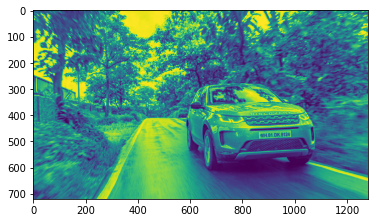

In [115]:
plt.imshow(redArr)

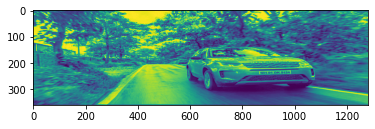

In [116]:
plt.imshow(outArr) # height is halved

In [117]:
x = redArr
fX, fY = 3, 3
filter = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
convArray = generateConvolutedArray(imageArray=x, kernelArray=filter, stride=2)

convArray.shape
#plotMatrix(convArray)

maxPoolingArray = generatePoolingArray(imageArray=x, kernelArray=filter, stride=2, poolingType="MAX")
maxPoolingArray.shape

(229401, 3, 3)
(229401, 3, 3)


(359, 639)

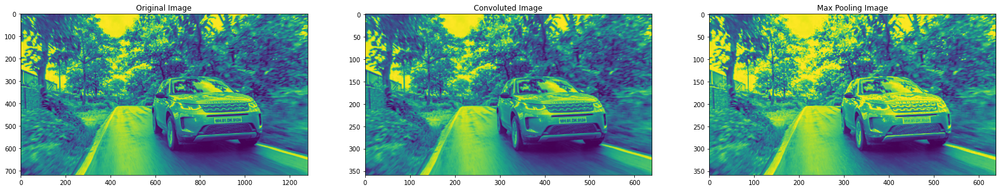

In [118]:
arrayMaps = dict()
arrayMaps['Original Image'] = x
arrayMaps['Convoluted Image'] = convArray
arrayMaps['Max Pooling Image'] = maxPoolingArray

plotArrays(arrayMaps)

In [119]:
x = redArr
fX, fY = 3, 3
filter = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
convArray = generateConvolutedArray(imageArray=x, kernelArray=filter, stride=2)

convArray.shape
#plotMatrix(convArray)

maxPoolingArray = generatePoolingArray(imageArray=convArray, kernelArray=filter, stride=2, poolingType="MAX")
maxPoolingArray.shape

(229401, 3, 3)
(57101, 3, 3)


(179, 319)

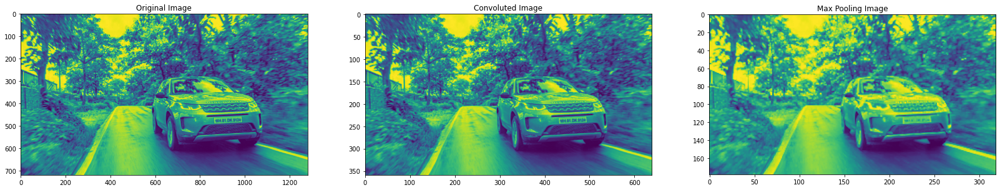

In [120]:
arrayMaps = dict()
arrayMaps['Original Image'] = x
arrayMaps['Convoluted Image'] = convArray
arrayMaps['Max Pooling Image'] = maxPoolingArray

plotArrays(arrayMaps)

In [121]:
redArr.shape

(720, 1280)

In [122]:
paddedX = generatePadding(x, paddingLayers=10)
fX, fY = 3, 3
filter = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)

convArray = generateConvolutedArray(imageArray=paddedX, kernelArray=filter, stride=2)

maxPoolingArray = generatePoolingArray(imageArray=convArray, kernelArray=filter, stride=2, poolingType="MAX")
maxPoolingArray.shape

(239481, 3, 3)
(59616, 3, 3)


(184, 324)

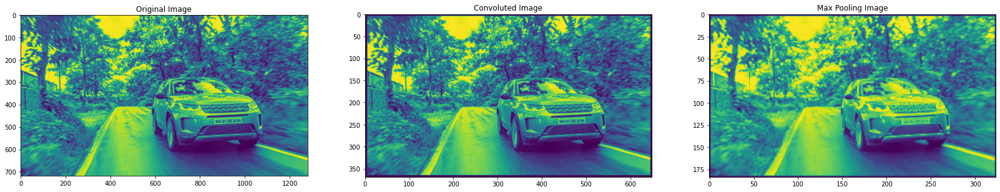

In [123]:
arrayMaps = dict()
arrayMaps['Original Image'] = x
arrayMaps['Convoluted Image'] = convArray
arrayMaps['Max Pooling Image'] = maxPoolingArray

plotArrays(arrayMaps)

In [124]:
x = redArr
fX, fY = 10, 10
s = 6
filter = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
convArray = generateConvolutedArray(imageArray=x, kernelArray=filter, stride=s)

convArray.shape
#plotMatrix(convArray)

(25228, 10, 10)


(119, 212)

In [125]:
maxPoolingArray = generatePoolingArray(imageArray=x, kernelArray=filter, stride=s, poolingType="MAX")
maxPoolingArray.shape

(25228, 10, 10)


(119, 212)

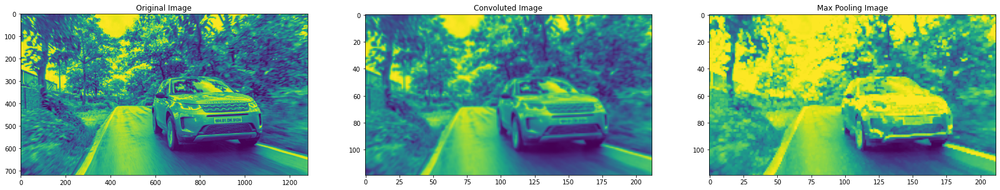

In [126]:
arrayMaps = dict()
arrayMaps['Original Image'] = x
arrayMaps['Convoluted Image'] = convArray
arrayMaps['Max Pooling Image'] = maxPoolingArray

plotArrays(arrayMaps)

In [127]:
!curl -v -k "https://www.flowerspicture.org/Flower_pictures_download/red-hibiscus-flower-hd-wallpaper.jpg" -o `pwd`/"sample_flower.jpg" > /dev/null 2>&1

In [128]:
!ls -lrtah

total 1.2M
drwxr-xr-x 1 root root 4.0K Dec 21 17:29 sample_data
drwxr-xr-x 1 root root 4.0K Dec 21 17:29 .config
drwxr-xr-x 1 root root 4.0K Dec 27 02:15 ..
-rw-r--r-- 1 root root 228K Dec 27 02:17 sample.jpg
drwxr-xr-x 1 root root 4.0K Dec 27 02:18 .
-rw-r--r-- 1 root root 886K Dec 27 02:18 sample_flower.jpg


In [129]:
import PIL
from PIL import Image, ImageFilter
import numpy as np
import matplotlib.pyplot as plt

SAMPLE_IMAGE="sample_flower.jpg"
img = Image.open(SAMPLE_IMAGE)

In [130]:
img.size

(3872, 2592)

In [131]:
np.asarray(img).shape

(2592, 3872, 3)

In [132]:
img.size[0] // 500, img.size[1] // 500, 

(7, 5)

In [133]:
img.width

3872

In [134]:
img.height

2592

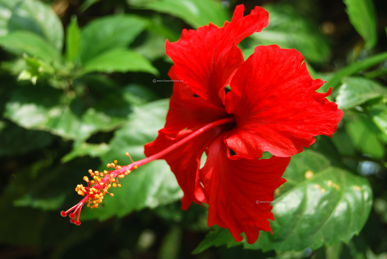

In [135]:
img.resize(size=(img.size[0]//10, img.size[1]//10))

In [136]:
# Box Blur kernel
box_kernel = [[1 / 9, 1 / 9, 1 / 9],
              [1 / 9, 1 / 9, 1 / 9],
              [1 / 9, 1 / 9, 1 / 9]]

# Gaussian kernel
gaussian_kernel = [[1 / 256, 4  / 256,  6 / 256,  4 / 256, 1 / 256],
                   [4 / 256, 16 / 256, 24 / 256, 16 / 256, 4 / 256],
                   [6 / 256, 24 / 256, 36 / 256, 24 / 256, 6 / 256],
                   [4 / 256, 16 / 256, 24 / 256, 16 / 256, 4 / 256],
                   [1 / 256, 4  / 256,  6 / 256,  4 / 256, 1 / 256]]

In [137]:
len(box_kernel)

3

(2592, 3872)
(1113270, 5, 5)
(123410, 3, 3)
(123410, 3, 3)


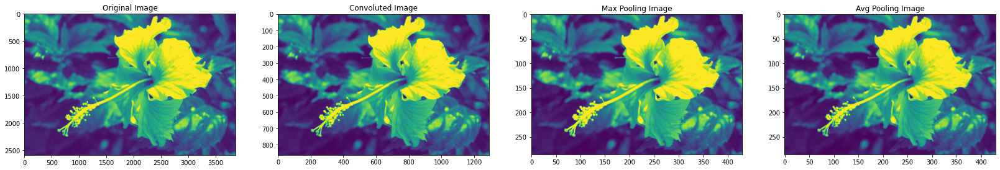

In [138]:
r = np.asarray(img.getchannel("R"))
print(r.shape)

fX, fY = 3, 3
#filterC = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
#filterC = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]).reshape(fX, fY) # edge detection
filterC = np.array(box_kernel)
convArrayR = generateConvolutedArray(imageArray=r, kernelArray=filterC, stride=3)

convArrayR.shape
#plotMatrix(convArrayR)

fX, fY = 3, 3
filterP = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
maxPoolingArrayR = generatePoolingArray(imageArray=convArrayR, kernelArray=filterP, stride=3, poolingType="MAX")
maxPoolingArrayR.shape

avgPoolingArrayR = generatePoolingArray(imageArray=convArrayR, kernelArray=filterP, stride=3, poolingType="AVG")
avgPoolingArrayR.shape

arrayMapsR = dict()
arrayMapsR['Original Image'] = r
arrayMapsR['Convoluted Image'] = convArrayR
arrayMapsR['Max Pooling Image'] = maxPoolingArrayR
arrayMapsR['Avg Pooling Image'] = avgPoolingArrayR

plotArrays(arrayMapsR)

(2592, 3872)
(1113270, 5, 5)
(123410, 3, 3)
(123410, 3, 3)


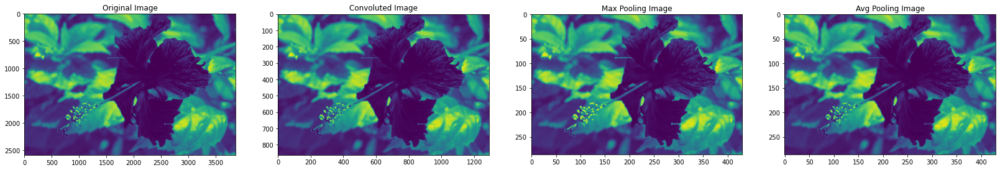

In [139]:
g = np.asarray(img.getchannel("G"))
print(g.shape)

fX, fY = 3, 3
#filterC = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
#filterC = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]).reshape(fX, fY) # edge detection
filterC = np.array(box_kernel)
convArrayG = generateConvolutedArray(imageArray=g, kernelArray=filterC, stride=3)

convArrayG.shape
#plotMatrix(convArrayG)

fX, fY = 3, 3
filterP = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
maxPoolingArrayG = generatePoolingArray(imageArray=convArrayG, kernelArray=filterP, stride=3, poolingType="MAX")
maxPoolingArrayG.shape

avgPoolingArrayG = generatePoolingArray(imageArray=convArrayG, kernelArray=filterP, stride=3, poolingType="AVG")
avgPoolingArrayG.shape

arrayMapsG = dict()
arrayMapsG['Original Image'] = g
arrayMapsG['Convoluted Image'] = convArrayG
arrayMapsG['Max Pooling Image'] = maxPoolingArrayG
arrayMapsG['Avg Pooling Image'] = avgPoolingArrayG

plotArrays(arrayMapsG)

(2592, 3872)
(1113270, 5, 5)
(123410, 3, 3)
(123410, 3, 3)


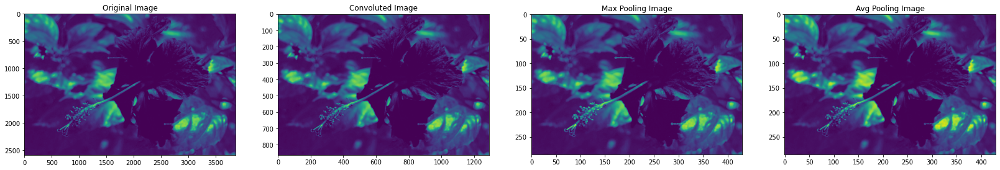

In [140]:
b = np.asarray(img.getchannel("B"))
print(b.shape)

fX, fY = 3, 3
#filterC = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
#filter = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]).reshape(fX, fY) # edge detection
filterC = np.array(box_kernel)
convArrayB = generateConvolutedArray(imageArray=b, kernelArray=filterC, stride=3)

convArrayB.shape
#plotMatrix(convArrayB)

fX, fY = 3, 3
filterP = np.random.randint(0, 2, size=(fX * fY)).reshape(fX, fY)
maxPoolingArrayB = generatePoolingArray(imageArray=convArrayB, kernelArray=filterP, stride=3, poolingType="MAX")
maxPoolingArrayB.shape

avgPoolingArrayB = generatePoolingArray(imageArray=convArrayB, kernelArray=filterP, stride=3, poolingType="AVG")
avgPoolingArrayB.shape

arrayMapsB = dict()
arrayMapsB['Original Image'] = b
arrayMapsB['Convoluted Image'] = convArrayB
arrayMapsB['Max Pooling Image'] = maxPoolingArrayB
arrayMapsB['Avg Pooling Image'] = avgPoolingArrayB

plotArrays(arrayMapsB)

(3872, 2592)


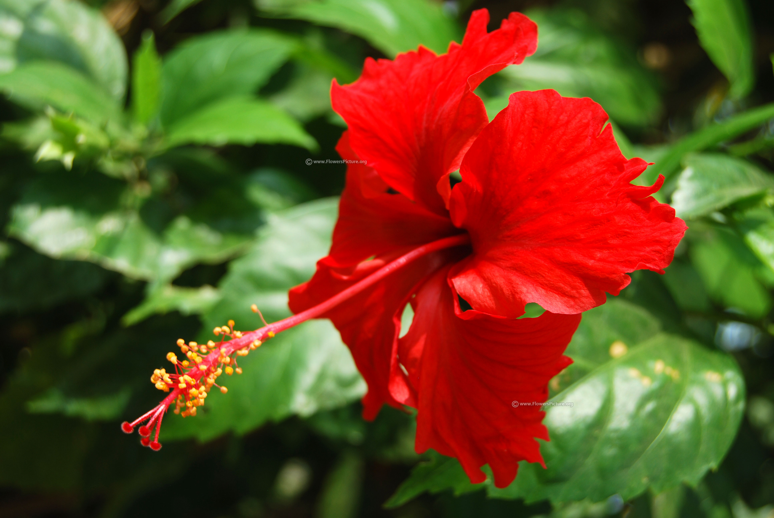

In [141]:
R = Image.fromarray(r)
G = Image.fromarray(g)
B = Image.fromarray(b)

image = Image.merge("RGB", (R,G,B))
print(image.size)
image.resize(size=(image.size[0]//5, image.size[1]//5))

In [142]:
print(convArrayR.shape)
print(maxPoolingArrayB.shape)
print(convArrayG.shape)
print(maxPoolingArrayG.shape)
print(convArrayB.shape)
print(maxPoolingArrayB.shape)

(863, 1290)
(287, 430)
(863, 1290)
(287, 430)
(863, 1290)
(287, 430)


In [143]:
R_c = Image.fromarray(convArrayR.astype(np.uint8))
G_c = Image.fromarray(convArrayG.astype(np.uint8))
B_c = Image.fromarray(convArrayB.astype(np.uint8))

image_c = Image.merge("RGB", (R_c,G_c,B_c))
print(image_c.size)
image_c

Output hidden; open in https://colab.research.google.com to view.

(430, 287)


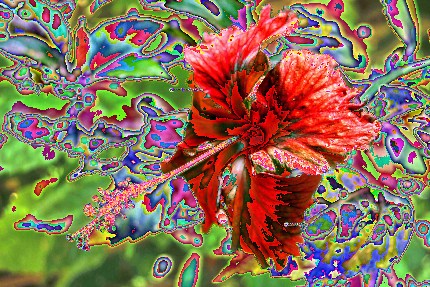

In [144]:
R_mp = Image.fromarray(maxPoolingArrayR.astype(np.uint8))
G_mp = Image.fromarray(maxPoolingArrayG.astype(np.uint8))
B_mp = Image.fromarray(maxPoolingArrayB.astype(np.uint8))

image_mp = Image.merge("RGB", (R_mp, G_mp, B_mp))
print(image_mp.size)
image_mp

(430, 287)


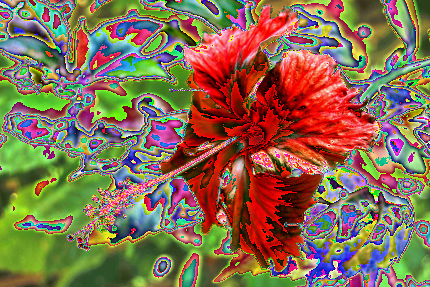

In [145]:
R_ap = Image.fromarray(avgPoolingArrayR.astype(np.uint8))
G_ap = Image.fromarray(avgPoolingArrayG.astype(np.uint8))
B_ap = Image.fromarray(avgPoolingArrayB.astype(np.uint8))

image_ap = Image.merge("RGB", (R_ap, G_ap, B_ap))
print(image_ap.size)
image_ap